On a fresh Anaconda environment:

``
conda create -y --name gis
conda activate gis
conda install -y geopandas matplotlib xlrd ipykernel  psycopg2 sqlalchemy
conda install -y -c conda-forge contextily
python -m ipykernel install --user --name=gis
``



In [1]:
import geopandas as gpd
import shapely
import contextily as ctx

In [2]:
import psycopg2 as pg

In [3]:
import pandas.io.sql as psql
import pandas as pd
import psycopg2 as pg
import sqlalchemy as sa
import os
import requests

import matplotlib.pyplot as plt

In [4]:
import os
import urllib

In [5]:
%matplotlib inline

In [6]:
pg_host="localhost"
pg_port="5432"
pg_dbname="postgres"
pg_user="postgres"
pg_password="postgres1234"

pg_schema = "gistest"
# connection_string =f"host='{pg_host}' port={pg_port} dbname={pg_dbname} user={pg_user}  password={pg_password}"
engine_url=f"postgresql+psycopg2://{pg_user}:{pg_password}@{pg_host}:{pg_port}/{pg_dbname}"
        
target_crs=  'epsg:4326'
lamb_crs = 'epsg:3857'

In [7]:
def download_if_nexist(url, filename):
    """
    If the (local) file <filename> does not exists, download it from <url> 

    Parameters
    ----------
    url: str
       url to fetch
    filename: str
       local file to save

    Returns
    -------

    None
    """
    if not os.path.isfile(filename):
        with urllib.request.urlopen(url) as response:
            with open(filename, "wb") as f:
                f.write(response.read())

In [8]:
# def get_request(query, params=None):
#     with pg.connect(connection_string) as connection:
#         connection.set_session(readonly=True)
#         return psql.read_sql(query, connection, params=params)


In [9]:
def get_request(query, params=None):
    sa_engine = sa.create_engine(engine_url)
    with sa_engine.connect() as connection:
        return psql.read_sql_query(query, connection, params=params)

In [10]:
def get_geo_request(query, params=None, geom_col="geometry"):
#     with pg.connect(database='postgres', user='postgres', host='localhost', password='example') as connection:
    sa_engine = sa.create_engine(engine_url)
    with sa_engine.connect() as connection:
#         connection.set_session(readonly=True)
        return gpd.read_postgis(query, connection, params=params, geom_col=geom_col)



In [11]:
# def get_geo_request(query, params=None, geom_col="geometry"):
# #     with pg.connect(database='postgres', user='postgres', host='localhost', password='example') as connection:
#     with pg.connect(connection_string) as connection:    
#         connection.set_session(readonly=True)
#         return gpd.read_postgis(query, connection, params=params, geom_col=geom_col)



In [12]:
def run_request(query, params=None):
    sa_engine = sa.create_engine(engine_url)
    with sa_engine.connect() as connection:
        psql.execute(query, connection, params=params)


In [13]:
def write_table(df, name):
    sa_engine = sa.create_engine(engine_url)
    with sa_engine.connect() as connection:
        df.to_sql(name=name, con=connection, if_exists="replace", schema=pg_schema, index=False)

In [14]:
def add_basemap(ax):
    """
    Add a basemap on a plot. Tries first default (Stamen) basemap. If errors, tries OpenStreetMap.Mapnik
    
    Parameters
    ----------
    ax: matplotlib axes
    
    Returns
    -------
        None
    """

    try: 
        ctx.add_basemap(ax)
    except requests.HTTPError:
        #print("Default basemap doesn't work...")
        ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

In [15]:
# Check that PostGIS is correctly installed
get_request("Select postgis_full_version()")

,postgis_full_version
0,"POSTGIS=""3.2.1 5fae8e5"" [EXTENSION] PGSQL=""140..."


# Load data

## Create schema

In [16]:
run_request(f"CREATE SCHEMA IF NOT EXISTS {pg_schema};")

In [17]:
for table in ["zipcodes", "zipcodes_boundaries", "zipcodes_centers", "statistical_sectors", "bpost_communes", "statbel_communes"]:
    run_request(f"DROP TABLE IF EXISTS {pg_schema}.{table}")


In [18]:
get_request(f"""SELECT * 
FROM pg_catalog.pg_tables
WHERE schemaname = '{pg_schema}';""")

,schemaname,tablename,tableowner,tablespace,hasindexes,hasrules,hastriggers,rowsecurity


## Download data

### Zip code list (BPost)

In [19]:
zipcodes_filename = "data/zipcodes_alpha_fr_new.xls"
download_if_nexist("http://www.bpost2.be/zipcodes/files/zipcodes_alpha_fr_new.xls",
                  zipcodes_filename)



zipcodes = pd.read_excel(zipcodes_filename)

zipcodes = zipcodes.rename({"Code postal":"zipcode", 
                            "Commune principale": "main_commune", 
                            "Localité":"locality",
                            "Province": "province",
                            "Sous-commune": "is_sub_commune"}, axis=1)
zipcodes["zipcode"] = zipcodes["zipcode"].astype(str)
zipcodes["is_special"] = zipcodes["is_sub_commune"].isnull()
zipcodes = zipcodes.sort_values("zipcode")
zipcodes["province"] = zipcodes.province.fillna(method="ffill")
print(zipcodes.zipcode.nunique(), "unique zipcodes")

zipcodes

1190 unique zipcodes


,zipcode,locality,is_sub_commune,main_commune,province,is_special
384,1000,Bruxelles,Non,BRUXELLES,BRUXELLES,False
92,1005,Assemblée Réunie de la Commission Communautaire,NaN,Assemblée Réunie de la Commission Communautaire,BRUXELLES,True
1964,1006,Raad van de Vlaamse Gemeenschapscommissie,NaN,Raad van de Vlaamse Gemeenschapscommissie,BRUXELLES,True
91,1007,Assemblée de la Commission Communautaire Franç...,NaN,Assemblée de la Commission Communautaire Franç...,BRUXELLES,True
424,1008,Chambre des Représentants,NaN,Chambre des Représentants,BRUXELLES,True
...,...,...,...,...,...,...
2608,9988,Waterland-Oudeman,Oui,SINT-LAUREINS,FLANDRE-ORIENTALE,False
2611,9988,Watervliet,Oui,SINT-LAUREINS,FLANDRE-ORIENTALE,False
1450,9990,Maldegem,Non,MALDEGEM,FLANDRE-ORIENTALE,False
20,9991,Adegem,Oui,MALDEGEM,FLANDRE-ORIENTALE,False


### Zipcode centers (AWN) 

In [20]:
zipcode_centers_filename = "data/zipcode_centers.geojson"

#https://data.gov.be/fr/dataset/328ba4f140ba0e870dfc9c70635fe7c1840980b1
download_if_nexist("https://www.odwb.be/api/v2/catalog/datasets/code-postaux-belge/exports/geojson",
                  zipcode_centers_filename)

zipcodes_centers = gpd.read_file(zipcode_centers_filename)
zipcodes_centers = zipcodes_centers.rename({"column_1": "zipcode", "column_2": "locality"}, axis=1)[["locality","zipcode", "geometry"]]

#zipcodes_centers = zipcodes_centers.to_crs(osm_crs)
zipcodes_centers


,locality,zipcode,geometry
0,Saint-Gilles,1060,POINT (4.34567 50.82674)
1,Molenbeek-Saint-Jean,1080,POINT (4.32278 50.85436)
2,Ganshoren,1083,POINT (4.31751 50.87124)
3,Neder-Over-Heembeek,1120,POINT (4.39049 50.89780)
4,Wavre,1300,POINT (4.60774 50.71642)
...,...,...,...
2752,Dikkelvenne,9890,POINT (3.68945 50.91767)
2753,Lovendegem,9920,POINT (3.60761 51.09568)
2754,Zomergem,9930,POINT (3.56424 51.11958)
2755,Waarschoot,9950,POINT (3.60617 51.15153)


In [21]:
zipcodes_centers.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

### Zip code boundaries (BPost)

In [22]:
zipcode_boundaries_filename = "data/zipcode_boundaries_shapefile_3812.zip"

# https://www.geo.be/catalog/details/9738c7c0-5255-11ea-8895-34e12d0f0423?l=fr
download_if_nexist("https://bgu.bpost.be/assets/9738c7c0-5255-11ea-8895-34e12d0f0423_x-shapefile_3812.zip",
                  zipcode_boundaries_filename)

zipcodes_boundaries = gpd.read_file(f"zip://{zipcode_boundaries_filename}/3812")

# Remark : CP_speciau is not reliable, it contains several errors --> we ignore it

zipcodes_boundaries = zipcodes_boundaries.rename({"nouveau_PO":"zipcode"}, axis=1)[["zipcode", "geometry"]]

#zipcodes_boundaries = zipcodes_boundaries.to_crs(osm_crs)
zipcodes_boundaries

,zipcode,geometry
0,5012,"POLYGON Z ((685645.150 628039.549 0.000, 68569..."
1,5012,"POLYGON Z ((685789.894 628275.337 0.000, 68578..."
2,5589,"POLYGON Z ((713828.210 594567.550 0.000, 71415..."
3,5560,"POLYGON Z ((691357.659 601352.353 0.000, 69137..."
4,5370,"POLYGON Z ((710598.535 623267.261 0.000, 71118..."
...,...,...
1263,2150,"POLYGON Z ((658001.941 710364.130 0.000, 65801..."
1264,2387,"POLYGON Z ((685989.777 734086.018 0.000, 68603..."
1265,2387,"POLYGON Z ((690034.221 738369.141 0.000, 69004..."
1266,2140,"POLYGON Z ((655308.148 712992.427 0.000, 65535..."


In [23]:
zipcodes_boundaries.crs

<Projected CRS: EPSG:3812>
Name: ETRS89 / Belgian Lambert 2008
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: Belgium - onshore
- bounds: (2.5, 49.5, 6.4, 51.51)
Coordinate Operation:
- name: Belgian Lambert 2008
- method: Lambert Conic Conformal (2SP)
Datum: European Terrestrial Reference System 1989
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

### NIS code boundaries

In [24]:
# https://statbel.fgov.be/fr/open-data/secteurs-statistiques-2020
sector_boundaries_filename="data/stat_sectors_2020.zip"
download_if_nexist("https://statbel.fgov.be/sites/default/files/files/opendata/Statistische%20sectoren/sh_statbel_statistical_sectors_31370_20200101.shp.zip",
                   sector_boundaries_filename)
statistical_sectors = gpd.read_file(f"zip://{sector_boundaries_filename}/sh_statbel_statistical_sectors_20200101.shp")
statistical_sectors.columns= statistical_sectors.columns.str.lower()
statistical_sectors

,cs01012020,t_sec_nl,t_sec_fr,t_sec_de,c_nis6,t_nis6_nl,t_nis6_fr,cnis5_2020,t_mun_nl,t_mun_fr,...,t_regio_nl,t_regio_fr,t_regio_de,c_country,nuts1,nuts2,nuts3,m_area_ha,m_peri_m,geometry
0,11001A00-,AARTSELAAR-CENTRUM,AARTSELAAR-CENTRUM,AARTSELAAR-CENTRUM,11001A,AARTSELAAR,AARTSELAAR,11001,Aartselaar,Aartselaar,...,Vlaams Gewest,Région flamande,Flämische Region,BE,BE2,BE21,BE211,53.158103,5248.0,"POLYGON Z ((151660.031 203013.606 0.000, 15185..."
1,11001A01-,DE LEEUWERIK,DE LEEUWERIK,DE LEEUWERIK,11001A,AARTSELAAR,AARTSELAAR,11001,Aartselaar,Aartselaar,...,Vlaams Gewest,Région flamande,Flämische Region,BE,BE2,BE21,BE211,67.114679,3935.0,"POLYGON Z ((151748.500 203170.481 0.000, 15173..."
2,11001A020,BUERSTEDE,BUERSTEDE,BUERSTEDE,11001A,AARTSELAAR,AARTSELAAR,11001,Aartselaar,Aartselaar,...,Vlaams Gewest,Région flamande,Flämische Region,BE,BE2,BE21,BE211,28.084365,2202.0,"POLYGON Z ((150636.359 202981.934 0.000, 15053..."
3,11001A030,YSSELAAR,YSSELAAR,YSSELAAR,11001A,AARTSELAAR,AARTSELAAR,11001,Aartselaar,Aartselaar,...,Vlaams Gewest,Région flamande,Flämische Region,BE,BE2,BE21,BE211,42.811849,3403.0,"POLYGON Z ((151584.547 203829.809 0.000, 15152..."
4,11001A042,KLEINE GRIPPE,KLEINE GRIPPE,KLEINE GRIPPE,11001A,AARTSELAAR,AARTSELAAR,11001,Aartselaar,Aartselaar,...,Vlaams Gewest,Région flamande,Flämische Region,BE,BE2,BE21,BE211,25.561955,2166.0,"POLYGON Z ((151748.500 203170.481 0.000, 15173..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19789,93090G191,BOIS DE NISMES,BOIS DE NISMES,BOIS DE NISMES,93090G,NISMES,NISMES,93090,Viroinval,Viroinval,...,Waals Gewest,Région wallonne,Wallonische Region,BE,BE3,BE35,BE353,1507.153385,24359.0,"POLYGON Z ((166383.594 80209.168 0.000, 166380..."
19790,93090H000,DOURBES-CENTRE,DOURBES-CENTRE,DOURBES-CENTRE,93090H,DOURBES*,DOURBES*,93090,Viroinval,Viroinval,...,Waals Gewest,Région wallonne,Wallonische Region,BE,BE3,BE35,BE353,19.381890,2569.0,"POLYGON Z ((165761.109 86583.363 0.000, 165757..."
19791,93090H012,DOURBES ROUTE DE MARIEMBOURG,DOURBES ROUTE DE MARIEMBOURG,DOURBES ROUTE DE MARIEMBOURG,93090H,DOURBES*,DOURBES*,93090,Viroinval,Viroinval,...,Waals Gewest,Région wallonne,Wallonische Region,BE,BE3,BE35,BE353,19.369718,2411.0,"POLYGON Z ((165761.109 86583.363 0.000, 165703..."
19792,93090H063,LORET,LORET,LORET,93090H,DOURBES*,DOURBES*,93090,Viroinval,Viroinval,...,Waals Gewest,Région wallonne,Wallonische Region,BE,BE3,BE35,BE353,24.865501,2559.0,"POLYGON Z ((165906.422 86861.793 0.000, 165861..."


In [25]:
statistical_sectors.crs

<Projected CRS: EPSG:31370>
Name: Belge 1972 / Belgian Lambert 72
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: Belgium - onshore
- bounds: (2.5, 49.5, 6.4, 51.51)
Coordinate Operation:
- name: Belgian Lambert 72
- method: Lambert Conic Conformal (2SP)
Datum: Reseau National Belge 1972
- Ellipsoid: International 1924
- Prime Meridian: Greenwich

## Push them to PostGIS

In [26]:
engine = sa.create_engine(engine_url)
zipcodes.to_sql(name="zipcodes", con=engine, if_exists="replace", schema=pg_schema, index=False)

In [27]:
zipcodes

,zipcode,locality,is_sub_commune,main_commune,province,is_special
384,1000,Bruxelles,Non,BRUXELLES,BRUXELLES,False
92,1005,Assemblée Réunie de la Commission Communautaire,NaN,Assemblée Réunie de la Commission Communautaire,BRUXELLES,True
1964,1006,Raad van de Vlaamse Gemeenschapscommissie,NaN,Raad van de Vlaamse Gemeenschapscommissie,BRUXELLES,True
91,1007,Assemblée de la Commission Communautaire Franç...,NaN,Assemblée de la Commission Communautaire Franç...,BRUXELLES,True
424,1008,Chambre des Représentants,NaN,Chambre des Représentants,BRUXELLES,True
...,...,...,...,...,...,...
2608,9988,Waterland-Oudeman,Oui,SINT-LAUREINS,FLANDRE-ORIENTALE,False
2611,9988,Watervliet,Oui,SINT-LAUREINS,FLANDRE-ORIENTALE,False
1450,9990,Maldegem,Non,MALDEGEM,FLANDRE-ORIENTALE,False
20,9991,Adegem,Oui,MALDEGEM,FLANDRE-ORIENTALE,False


In [28]:
write_table(zipcodes, "zipcodes")

In [29]:
get_request(f"""SELECT *
FROM {pg_schema}.zipcodes;""")

,zipcode,locality,is_sub_commune,main_commune,province,is_special
0,1000,Bruxelles,Non,BRUXELLES,BRUXELLES,False
1,1005,Assemblée Réunie de la Commission Communautaire,None,Assemblée Réunie de la Commission Communautaire,BRUXELLES,True
2,1006,Raad van de Vlaamse Gemeenschapscommissie,None,Raad van de Vlaamse Gemeenschapscommissie,BRUXELLES,True
3,1007,Assemblée de la Commission Communautaire Franç...,None,Assemblée de la Commission Communautaire Franç...,BRUXELLES,True
4,1008,Chambre des Représentants,None,Chambre des Représentants,BRUXELLES,True
...,...,...,...,...,...,...
2760,9988,Waterland-Oudeman,Oui,SINT-LAUREINS,FLANDRE-ORIENTALE,False
2761,9988,Watervliet,Oui,SINT-LAUREINS,FLANDRE-ORIENTALE,False
2762,9990,Maldegem,Non,MALDEGEM,FLANDRE-ORIENTALE,False
2763,9991,Adegem,Oui,MALDEGEM,FLANDRE-ORIENTALE,False


In [30]:
#engine = create_engine(engine_url)
zipcodes_boundaries.to_crs(target_crs).to_postgis(name="zipcodes_boundaries", con=engine, if_exists="replace", schema=pg_schema)

In [31]:
r=get_geo_request(f"""SELECT *
FROM {pg_schema}.zipcodes_boundaries;""")
r

,zipcode,geometry
0,5012,"POLYGON Z ((4.87072 50.46206 0.00000, 4.87145 ..."
1,5012,"POLYGON Z ((4.87278 50.46417 0.00000, 4.87266 ..."
2,5589,"POLYGON Z ((5.26190 50.15873 0.00000, 5.26645 ..."
3,5560,"POLYGON Z ((4.94819 50.22175 0.00000, 4.94844 ..."
4,5370,"POLYGON Z ((5.22136 50.41708 0.00000, 5.22950 ..."
...,...,...
1263,2150,"POLYGON Z ((4.48332 51.20318 0.00000, 4.48354 ..."
1264,2387,"POLYGON Z ((4.88617 51.41529 0.00000, 4.88681 ..."
1265,2387,"POLYGON Z ((4.94479 51.45351 0.00000, 4.94493 ..."
1266,2140,"POLYGON Z ((4.44482 51.22684 0.00000, 4.44544 ..."


<AxesSubplot:>

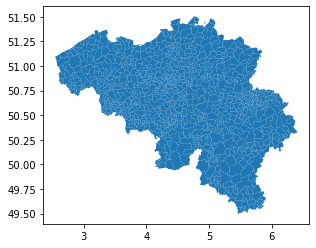

In [32]:
r.plot()

In [33]:
zipcodes_centers.to_crs(target_crs).to_postgis(name="zipcodes_centers", con=engine, if_exists="replace", schema=pg_schema)

In [34]:
r=get_geo_request(f"""SELECT *
FROM {pg_schema}.zipcodes_centers;""")
r

,locality,zipcode,geometry
0,Saint-Gilles,1060,POINT (4.34567 50.82674)
1,Molenbeek-Saint-Jean,1080,POINT (4.32278 50.85436)
2,Ganshoren,1083,POINT (4.31751 50.87124)
3,Neder-Over-Heembeek,1120,POINT (4.39049 50.89780)
4,Wavre,1300,POINT (4.60774 50.71642)
...,...,...,...
2752,Dikkelvenne,9890,POINT (3.68945 50.91767)
2753,Lovendegem,9920,POINT (3.60761 51.09568)
2754,Zomergem,9930,POINT (3.56424 51.11958)
2755,Waarschoot,9950,POINT (3.60617 51.15153)


<AxesSubplot:>

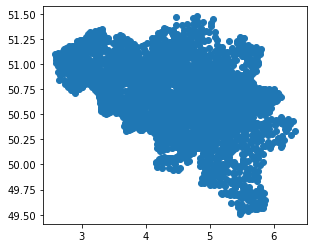

In [35]:
r.plot()

In [36]:
statistical_sectors.to_crs(target_crs).to_postgis(name="statistical_sectors", con=engine, if_exists="replace", schema=pg_schema)

In [37]:
sectors = get_geo_request(f"""SELECT *
FROM {pg_schema}.statistical_sectors;""")
sectors

,cs01012020,t_sec_nl,t_sec_fr,t_sec_de,c_nis6,t_nis6_nl,t_nis6_fr,cnis5_2020,t_mun_nl,t_mun_fr,...,t_regio_nl,t_regio_fr,t_regio_de,c_country,nuts1,nuts2,nuts3,m_area_ha,m_peri_m,geometry
0,11001A00-,AARTSELAAR-CENTRUM,AARTSELAAR-CENTRUM,AARTSELAAR-CENTRUM,11001A,AARTSELAAR,AARTSELAAR,11001,Aartselaar,Aartselaar,...,Vlaams Gewest,Région flamande,Flämische Region,BE,BE2,BE21,BE211,53.158103,5248.0,"POLYGON Z ((4.39247 51.13717 0.00000, 4.39519 ..."
1,11001A01-,DE LEEUWERIK,DE LEEUWERIK,DE LEEUWERIK,11001A,AARTSELAAR,AARTSELAAR,11001,Aartselaar,Aartselaar,...,Vlaams Gewest,Région flamande,Flämische Region,BE,BE2,BE21,BE211,67.114679,3935.0,"POLYGON Z ((4.39374 51.13858 0.00000, 4.39356 ..."
2,11001A020,BUERSTEDE,BUERSTEDE,BUERSTEDE,11001A,AARTSELAAR,AARTSELAAR,11001,Aartselaar,Aartselaar,...,Vlaams Gewest,Région flamande,Flämische Region,BE,BE2,BE21,BE211,28.084365,2202.0,"POLYGON Z ((4.37785 51.13689 0.00000, 4.37634 ..."
3,11001A030,YSSELAAR,YSSELAAR,YSSELAAR,11001A,AARTSELAAR,AARTSELAAR,11001,Aartselaar,Aartselaar,...,Vlaams Gewest,Région flamande,Flämische Region,BE,BE2,BE21,BE211,42.811849,3403.0,"POLYGON Z ((4.39140 51.14451 0.00000, 4.39057 ..."
4,11001A042,KLEINE GRIPPE,KLEINE GRIPPE,KLEINE GRIPPE,11001A,AARTSELAAR,AARTSELAAR,11001,Aartselaar,Aartselaar,...,Vlaams Gewest,Région flamande,Flämische Region,BE,BE2,BE21,BE211,25.561955,2166.0,"POLYGON Z ((4.39374 51.13858 0.00000, 4.39350 ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19789,93090G191,BOIS DE NISMES,BOIS DE NISMES,BOIS DE NISMES,93090G,NISMES,NISMES,93090,Viroinval,Viroinval,...,Waals Gewest,Région wallonne,Wallonische Region,BE,BE3,BE35,BE353,1507.153385,24359.0,"POLYGON Z ((4.59742 50.03294 0.00000, 4.59738 ..."
19790,93090H000,DOURBES-CENTRE,DOURBES-CENTRE,DOURBES-CENTRE,93090H,DOURBES*,DOURBES*,93090,Viroinval,Viroinval,...,Waals Gewest,Région wallonne,Wallonische Region,BE,BE3,BE35,BE353,19.381890,2569.0,"POLYGON Z ((4.58900 50.09027 0.00000, 4.58894 ..."
19791,93090H012,DOURBES ROUTE DE MARIEMBOURG,DOURBES ROUTE DE MARIEMBOURG,DOURBES ROUTE DE MARIEMBOURG,93090H,DOURBES*,DOURBES*,93090,Viroinval,Viroinval,...,Waals Gewest,Région wallonne,Wallonische Region,BE,BE3,BE35,BE353,19.369718,2411.0,"POLYGON Z ((4.58900 50.09027 0.00000, 4.58819 ..."
19792,93090H063,LORET,LORET,LORET,93090H,DOURBES*,DOURBES*,93090,Viroinval,Viroinval,...,Waals Gewest,Région wallonne,Wallonische Region,BE,BE3,BE35,BE353,24.865501,2559.0,"POLYGON Z ((4.59104 50.09277 0.00000, 4.59041 ..."


<AxesSubplot:>

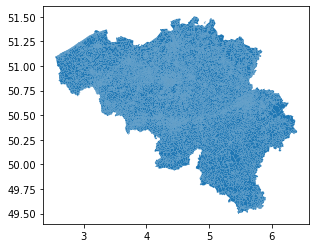

In [38]:
sectors.plot()

# Basic functions

## Distance

In [39]:
get_request("""
SELECT a.locality, b.locality, 
ST_Distance(a.geometry, b.geometry),
ST_DistanceSphere(a.geometry, b.geometry)
from gistest.zipcodes_centers a, gistest.zipcodes_centers b
WHERE a.zipcode='1160' and b.zipcode='5190'""")

,locality,locality,st_distance,st_distancesphere
0,Auderghem,Balâtre,0.377856,38134.345601
1,Auderghem,Moustier-Sur-Sambre,0.437830,43089.000477
2,Auderghem,Saint-Martin,0.380737,38121.847291
3,Auderghem,Ham-Sur-Sambre,0.442193,44618.069937
4,Auderghem,Mornimont,0.450833,44379.139044
5,Auderghem,Spy,0.429590,41768.067932
6,Auderghem,Jemeppe-Sur-Sambre,0.416430,42209.589491
7,Auderghem,Onoz,0.400612,39630.807359


## Area

In [40]:
get_request("""
SELECT zipcode ,
ST_Area(ST_Transform(geometry, 31370)), ST_Area(geometry)
from gistest.zipcodes_boundaries
WHERE zipcode='5190'
""")

,zipcode,st_area,st_area
0,5190,4.696304e+07,0.005948


## Aggregation

In [41]:
prov = get_geo_request("""
SELECT 
	c_provi, t_provi_fr, t_regio_fr,  
	ST_Union(geometry) as geometry
FROM gistest.statistical_sectors
GROUP BY c_provi, t_provi_fr, t_regio_fr
""")
prov

,c_provi,t_provi_fr,t_regio_fr,geometry
0,-,None,Région de Bruxelles-Capitale,"POLYGON Z ((4.29740 50.81001 0.00000, 4.29735 ..."
1,10000,Province d’Anvers,Région flamande,"MULTIPOLYGON Z (((4.93579 51.40930 0.00000, 4...."
2,20001,Province du Brabant flamand,Région flamande,"POLYGON Z ((5.10784 50.72285 0.00000, 5.10736 ..."
3,20002,Province du Brabant wallon,Région wallonne,"POLYGON Z ((4.14575 50.63660 0.00000, 4.14578 ..."
4,30000,Province de Flandre occidentale,Région flamande,"POLYGON Z ((2.84230 50.73559 0.00000, 2.84250 ..."
5,40000,Province de Flandre orientale,Région flamande,"POLYGON Z ((3.49165 50.75792 0.00000, 3.49161 ..."
6,50000,Province du Hainaut,Région wallonne,"MULTIPOLYGON Z (((2.91167 50.70400 0.00000, 2...."
7,60000,Province de Liège,Région wallonne,"POLYGON Z ((5.35148 50.38838 0.00000, 5.35144 ..."
8,70000,Province du Limbourg,Région flamande,"MULTIPOLYGON Z (((5.89564 50.74545 0.00000, 5...."
9,80000,Province du Luxembourg,Région wallonne,"POLYGON Z ((5.01249 49.99737 0.00000, 5.01249 ..."


<AxesSubplot:>

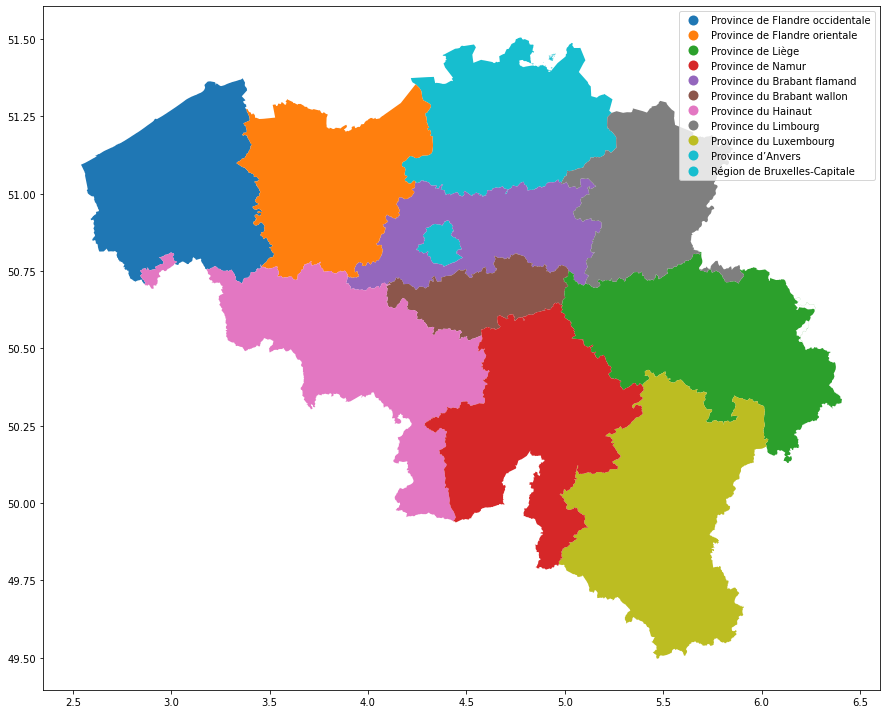

In [42]:
prov.assign(label=prov.t_provi_fr.fillna(prov.t_regio_fr)).plot("label", legend=True, figsize=(15,15))

### Create Statbel communes

In [43]:
run_request(f"DROP TABLE IF EXISTS {pg_schema}.statbel_communes")
run_request(f"""
CREATE TABLE {pg_schema}.statbel_communes AS -- or: CREATE VIEW
    SELECT cnis5_2020, -- Code NIS5
           t_mun_fr,   -- Commune name
           t_mun_nl,
           ST_Union(geometry) AS geometry
    FROM {pg_schema}.statistical_sectors
    GROUP BY cnis5_2020, t_mun_fr, t_mun_nl
""")

### Create bPost communes

In [44]:
# Update zipcode to add a column "main_commune2", which corrects values for special zipcodes

In [45]:
run_request(f"""
ALTER TABLE {pg_schema}.zipcodes 
ADD COLUMN IF NOT EXISTS main_commune2 VARCHAR ;""")


In [46]:
# Populate main_commune2 with :
# - main_commune for "normal" zipcodes
# - commune name from statbel_communes for special zipcode codes, using spatial join
run_request(f"""
with 
special_codes as ( 
    select distinct zb.* 
    from {pg_schema}.zipcodes_boundaries zb join {pg_schema}.zipcodes z on zb.zipcode =z.zipcode 
    where z.is_special), -- "is_special" in zipcode_boundary is not reliable!
main_commune as (
    select sc.zipcode as special_code, sc.geometry as sg,
    case 
        when left(nb.cnis5_2020, 1) in ('5','6','8','9') or nb.cnis5_2020 like '21%%' then upper(t_mun_fr)
        else upper(t_mun_nl)
    end as main_commune
    from special_codes sc left join {pg_schema}.statbel_communes nb 
    on ST_CONTAINS(st_buffer(nb.geometry, 0.00001), sc.geometry)) -- Allows to take into account small differences between
                                                                  -- boundaries. It makes index to be ignore, increasing execution time
update {pg_schema}.zipcodes 
set main_commune2 = main_commune.main_commune
from main_commune
where main_commune.special_code=zipcodes.zipcode""")

run_request(f"""
update {pg_schema}.zipcodes 
set main_commune2=main_commune 
where is_special is false
""")

In [47]:
run_request(f"DROP TABLE IF EXISTS {pg_schema}.bpost_communes")
run_request(f"""
CREATE TABLE {pg_schema}.bpost_communes AS  -- or: CREATE VIEW
    SELECT main_commune2 as main_commune, 
           ST_Union(geometry) AS geometry
    FROM {pg_schema}.zipcodes zp 
      JOIN {pg_schema}.zipcodes_boundaries zp_bnd 
      ON zp.zipcode = zp_bnd.zipcode
    GROUP BY main_commune2
""")

# Spatial join

## Mismatch centers-zipcode boundaries

In [48]:
get_geo_request(f"""
SELECT 
	bnd.zipcode  as bnd_zipcode, 	ctr.zipcode  as ctr_zipcode, 
	locality     as ctr_locality, 
	bnd.geometry as bnd_geometry, ctr.geometry as ctr_geometry
FROM {pg_schema}.zipcodes_boundaries bnd
	JOIN {pg_schema}.zipcodes_centers ctr 
	ON ST_Contains(bnd.geometry, ctr.geometry)
WHERE bnd.zipcode != ctr.zipcode
""", geom_col="bnd_geometry"
)

,bnd_zipcode,ctr_zipcode,ctr_locality,bnd_geometry,ctr_geometry
0,2000,2050,Antwerpen,"POLYGON Z ((4.41475 51.23640 0.00000, 4.41468 ...",0101000020E610000002C985144D991140082A99524D9C...
1,3700,3840,Kolmont,"POLYGON Z ((5.51358 50.82111 0.00000, 5.51385 ...",0101000020E6100000F4A62215C6AE1540C1919B3CC066...
2,4122,4120,Neupré,"POLYGON Z ((5.54713 50.56133 0.00000, 5.54732 ...",0101000020E6100000820B68D8DEF515403240FDC28645...
3,6820,4800,Lambermont,"POLYGON Z ((5.19925 49.77564 0.00000, 5.19958 ...",0101000020E6100000600322C495C3144019FCA2A943DA...
4,4852,4850,Plombières,"POLYGON Z ((5.96689 50.73870 0.00000, 5.96671 ...",0101000020E6100000CBF8F71917D61740B47977BF655E...
5,5541,5540,Hastière,"POLYGON Z ((4.83445 50.21656 0.00000, 4.83525 ...",0101000020E6100000F2D814A54B4A1340D854CCF74219...
6,4987,5600,Neuville,"POLYGON Z ((5.85104 50.39104 0.00000, 5.85058 ...",0101000020E6100000215DC7139CE516402ED1B41F8431...
7,1541,8600,Driekapellen,"POLYGON Z ((3.97683 50.72543 0.00000, 3.97699 ...",0101000020E610000031AC87D459E20F40BEB623415D5A...
8,9220,1785,Hamme,"POLYGON Z ((4.17578 51.10117 0.00000, 4.17448 ...",0101000020E6100000EAED92E22A7B1040D5E0C7E2488B...
9,3300,3470,Sint-Margriete-Houtem,"POLYGON Z ((4.91053 50.86426 0.00000, 4.91055 ...",0101000020E6100000104472477AD913407B3CE3B1D56A...


## Internal mismatch @ Bpost

In [49]:
bpost_mismatch=get_geo_request("""
SELECT 
    zp1.zipcode as zipcode_1, 
    zp2.zipcode as zipcode_2, 
	zp1.geometry as geometry_1, 
    zp2.geometry as geometry_2, 
	ST_intersection(zp1.geometry, zp2.geometry) as geometry_common, 
	st_area(ST_intersection(zp1.geometry, zp2.geometry))/ST_Area(zp1.geometry) 
		AS common_ratio
 FROM gistest.zipcodes_boundaries zp1 
 JOIN gistest.zipcodes_boundaries zp2 
 ON ST_intersects(zp1.geometry, zp2.geometry) 
	AND zp1.zipcode < zp2.zipcode
 	AND ST_Area(ST_Intersection(zp1.geometry, zp2.geometry))/ST_Area(zp1.geometry) >0.01
 ORDER BY common_ratio""", geom_col="geometry_common")
bpost_mismatch

,zipcode_1,zipcode_2,geometry_1,geometry_2,geometry_common,common_ratio
0,1831,1931,01030000A0E610000001000000310100005208FF653BC7...,01030000A0E61000000200000083000000588789C828D6...,GEOMETRYCOLLECTION Z (LINESTRING Z (4.44669 50...,0.107855
1,1830,1931,01030000A0E61000000400000059010000F701590FCED5...,01030000A0E61000000200000083000000588789C828D6...,GEOMETRYCOLLECTION Z (LINESTRING Z (4.46003 50...,0.154265
2,7010,7020,01030000A0E61000000100000095000000BABC307061D1...,01030000A0E610000001000000B50100005873C7A1DBD1...,GEOMETRYCOLLECTION Z (LINESTRING Z (3.97759 50...,0.249747
3,6075,6220,01030000A0E6100000010000000E0000002509E7593C1D...,01030000A0E610000001000000F706000031A618DD033B...,"POLYGON Z ((4.52855 50.46602 0.00000, 4.52764 ...",1.000000
4,6099,6220,01030000A0E6100000010000000E0000002509E7593C1D...,01030000A0E610000001000000F706000031A618DD033B...,"POLYGON Z ((4.52855 50.46602 0.00000, 4.52764 ...",1.000000
5,1105,612,01030000A0E610000001000000080000000105E8D3AC69...,01030000A0E610000001000000080000000105E8D3AC69...,"POLYGON Z ((4.35320 50.85014 0.00000, 4.35325 ...",1.000000
6,1043,1044,01030000A0E6100000010000002800000014555F4DC79D...,01030000A0E61000000100000028000000015970ECAA9E...,"POLYGON Z ((4.40408 50.85202 0.00000, 4.40209 ...",1.000000
7,1049,1140,01030000A0E6100000010000001100000097D721EA55A8...,01030000A0E61000000100000091000000CA1E5015A39C...,"POLYGON Z ((4.41439 50.87627 0.00000, 4.41437 ...",1.000000
8,1046,1049,01030000A0E6100000010000001100000097D721EA55A8...,01030000A0E6100000010000001100000097D721EA55A8...,"POLYGON Z ((4.41439 50.87627 0.00000, 4.41437 ...",1.000000
9,1046,1140,01030000A0E6100000010000001100000097D721EA55A8...,01030000A0E61000000100000091000000CA1E5015A39C...,"POLYGON Z ((4.41439 50.87627 0.00000, 4.41437 ...",1.000000


In [50]:
bpost_mismatch.geometry_1 = bpost_mismatch.geometry_1.apply(     shapely.wkb.loads, hex=True)
bpost_mismatch.geometry_2 = bpost_mismatch.geometry_2.apply(     shapely.wkb.loads, hex=True)

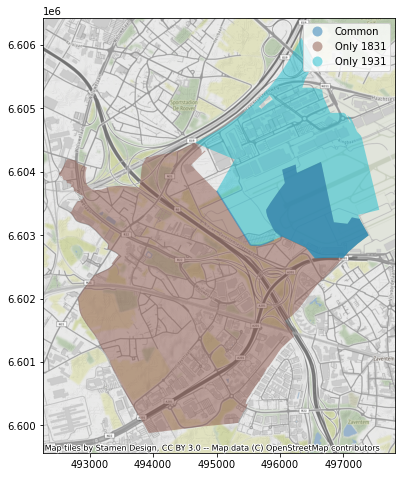

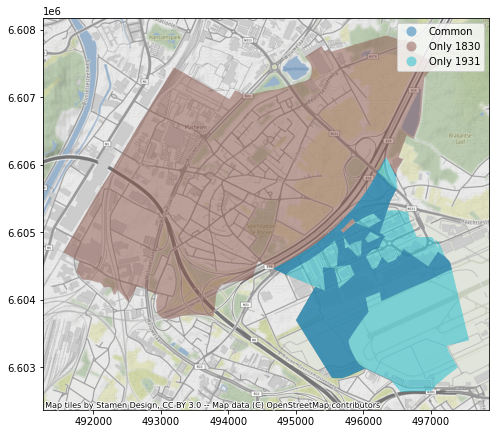

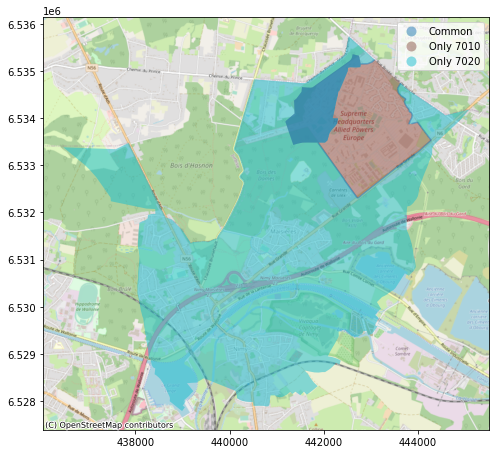

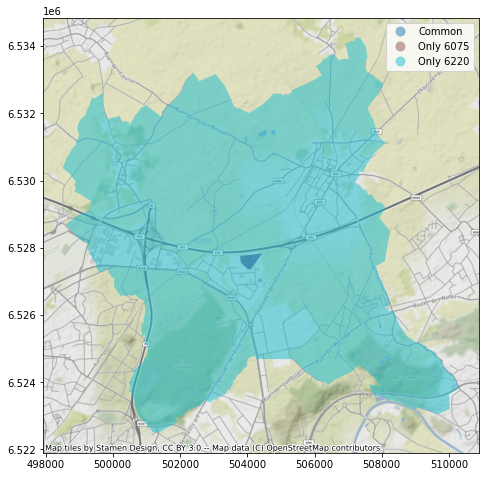

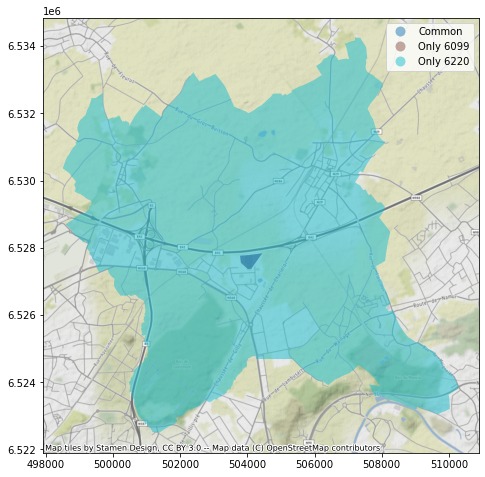

/home/vandy/anaconda3/envs/gis/lib/python3.8/site-packages/contextily/tile.py:632: UserWarning: The inferred zoom level of 21 is not valid for the current tile provider (valid zooms: 0 - 18).
  warnings.warn(msg)


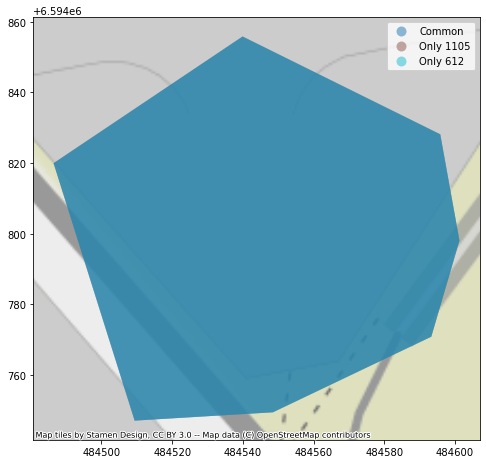

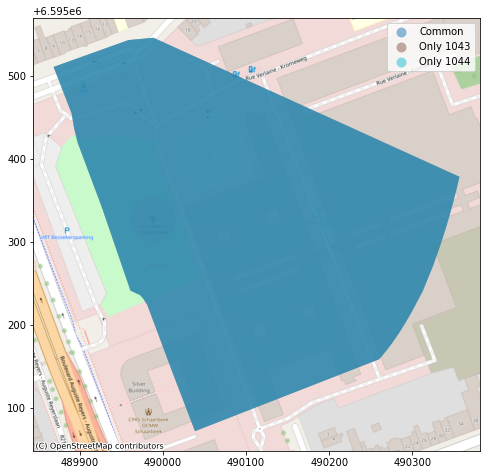

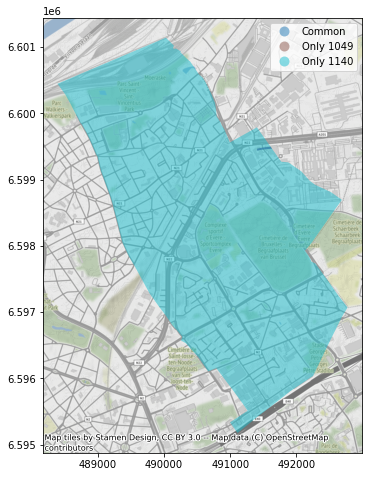

/home/vandy/anaconda3/envs/gis/lib/python3.8/site-packages/contextily/tile.py:632: UserWarning: The inferred zoom level of 21 is not valid for the current tile provider (valid zooms: 0 - 18).
  warnings.warn(msg)
/home/vandy/anaconda3/envs/gis/lib/python3.8/site-packages/contextily/tile.py:632: UserWarning: The inferred zoom level of 21 is not valid for the current tile provider (valid zooms: 0 - 19).
  warnings.warn(msg)


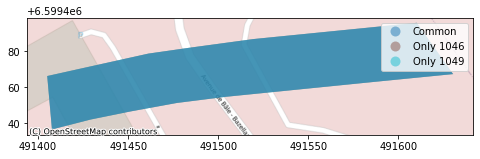

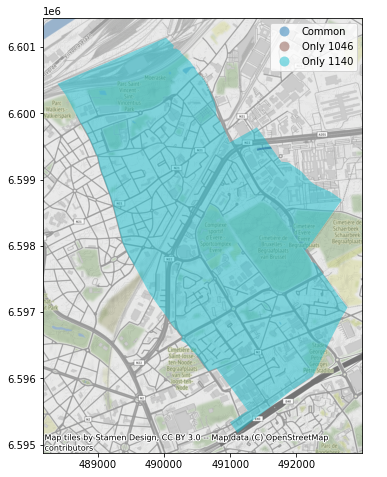

/home/vandy/anaconda3/envs/gis/lib/python3.8/site-packages/contextily/tile.py:632: UserWarning: The inferred zoom level of 20 is not valid for the current tile provider (valid zooms: 0 - 18).
  warnings.warn(msg)
/home/vandy/anaconda3/envs/gis/lib/python3.8/site-packages/contextily/tile.py:632: UserWarning: The inferred zoom level of 20 is not valid for the current tile provider (valid zooms: 0 - 19).
  warnings.warn(msg)


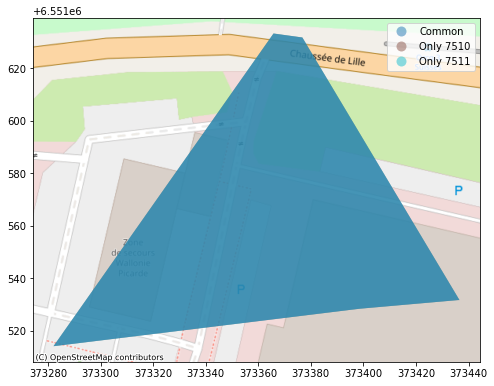

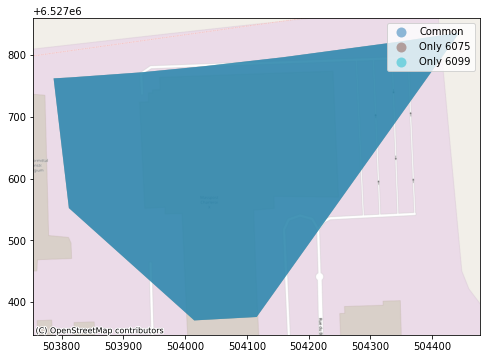

In [51]:
for key, rec in bpost_mismatch.iterrows():
    #print(rec)
    
    df = rec[["geometry_1", "geometry_2", "geometry_common"]].rename("geom").reset_index().set_geometry("geom").set_crs(target_crs).to_crs(lamb_crs)
    df["index"] = df["index"].replace({"geometry_1":"Only "+rec.zipcode_1, "geometry_2":"Only "+rec.zipcode_2, "geometry_common": "Common"})
    ax = df.plot("index", legend=True, figsize=(8,8), alpha=0.5)
    add_basemap(ax)
    plt.show()

## Mismatch between Statbel & BPost communes

In [52]:
run_request(f"""
CREATE INDEX IF NOT EXISTS idx_statbel_communes_geometry
  ON {pg_schema}.statbel_communes
  USING GIST (geometry);
  
CREATE INDEX IF NOT EXISTS  idx_bpost_communes_geometry
  ON {pg_schema}.bpost_communes
  USING GIST (geometry);""")

In [53]:
bpost_statbel_mismatch=get_request("""
SELECT cnis5_2020, t_mun_fr, main_commune, 
    nis_bnd.geometry as nis_geom,
    zip_bnd.geometry as zip_geom,
    ST_Difference(nis_bnd.geometry, zip_bnd.geometry) as only_nis_geom,
    ST_Difference(zip_bnd.geometry, nis_bnd.geometry) as only_zip_geom,
    ST_Intersection(nis_bnd.geometry, zip_bnd.geometry) as common_geom,
    ST_Area(ST_Intersection(nis_bnd.geometry, zip_bnd.geometry)) / ST_Area(nis_bnd.geometry) as overlap_ratio
FROM gistest.statbel_communes nis_bnd
JOIN gistest.bpost_communes zip_bnd
ON   ST_Intersects(nis_bnd.geometry, zip_bnd.geometry) 
WHERE ST_Area(ST_Intersection(nis_bnd.geometry, zip_bnd.geometry)) / ST_Area(nis_bnd.geometry) between 0.5 and 0.99 """)
bpost_statbel_mismatch

,cnis5_2020,t_mun_fr,main_commune,nis_geom,zip_geom,only_nis_geom,only_zip_geom,common_geom,overlap_ratio
0,13002,Baerle-Duc,BAARLE-HERTOG,01060000A0E61000001A00000001030000800100000020...,01060000A0E61000001700000001030000800100000053...,01060000A0E6100000F300000001030000800100000020...,01060000A0E6100000F000000001030000800100000010...,01060000A0E61000001800000001030000800100000069...,0.942509
1,21004,Bruxelles,BRUXELLES,01030000A0E610000001000000B20C00006AC51F94E885...,01060000A0E61000000600000001030000800100000015...,01060000A0E6100000E2000000010300008001000000F9...,01060000A0E6100000DC00000001030000800100000037...,01060000A0E61000000600000001030000800B000000D9...,0.936679
2,21015,Schaerbeek,SCHAERBEEK,01030000A0E61000000100000006030000723C7E11FE9D...,01030000A0E6100000030000002D0100003FF59329D28E...,01060000A0E61000003100000001030000800100000004...,01060000A0E61000002F00000001030000800100000004...,01030000A0E61000000300000090020000723C7E11FE9D...,0.985770
3,23023,Gammerages,GALMAARDEN,01030000A0E610000001000000701100005C9D5ED00E07...,01030000A0E610000001000000C70900001ABF7D54961B...,01060000A0E61000006901000001030000800100000010...,01060000A0E61000006901000001030000800100000012...,01030000A0E6100000010000002E1000005C9D5ED00E07...,0.989833
4,23047,Machelen,MACHELEN,01030000A0E61000000100000052020000AA8B37B78AD3...,01030000A0E61000000C000000A3010000F77DD13889D8...,01060000A0E61000003F00000001030000800100000007...,01060000A0E61000003400000001030000800100000005...,01030000A0E61000000C00000072020000AA8B37B78AD3...,0.943414
5,23088,Vilvorde,VILVOORDE,01030000A0E610000001000000C1090000C994A61B9BB7...,01030000A0E610000001000000C2050000329B6D25D5E8...,01060000A0E61000008800000001030000800100000007...,01060000A0E61000008800000001030000800100000013...,01030000A0E61000000100000035080000C994A61B9BB7...,0.952227
6,23096,Zemst,ZEMST,01030000A0E610000001000000CE0B0000925CC420BA0D...,01060000A0E61000000200000001030000800100000020...,01060000A0E6100000F700000001030000800100000018...,01060000A0E6100000F800000001030000800100000006...,01060000A0E6100000020000000103000080010000003D...,0.986310
7,23098,Drogenbos,DROGENBOS,01030000A0E61000000100000039040000554BAE8DC546...,01030000A0E610000001000000B3030000381CC2F61A35...,01060000A0E61000005D00000001030000800100000008...,01060000A0E61000005D0000000103000080010000005D...,01030000A0E610000001000000B3040000554BAE8DC546...,0.961104
8,25068,Mont-Saint-Guibert,MONT-SAINT-GUIBERT,01030000A0E61000000100000065050000B272269D2388...,01060000A0E61000000200000001030000800100000062...,01060000A0E61000007500000001030000800100000015...,01060000A0E61000007600000001030000800100000004...,01060000A0E610000002000000010300008001000000B5...,0.976050
9,25110,Waterloo,WATERLOO,01030000A0E610000001000000E9030000F837D4FF3585...,01030000A0E61000000100000091020000C4CF403350B2...,01060000A0E61000005400000001030000800100000004...,01060000A0E61000005400000001030000800100000007...,01030000A0E610000001000000B5030000F837D4FF3585...,0.987917


In [54]:
for geom_col in ["nis_geom", "zip_geom", "only_nis_geom", "only_zip_geom", "common_geom"]: 
    bpost_statbel_mismatch[geom_col]= bpost_statbel_mismatch[geom_col].apply(     shapely.wkb.loads, hex=True)

In [55]:
# bpost_statbel_mismatch

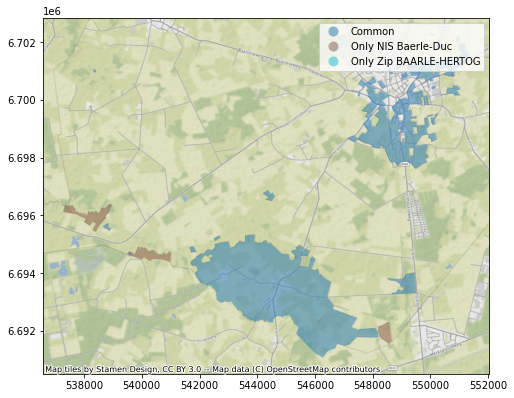

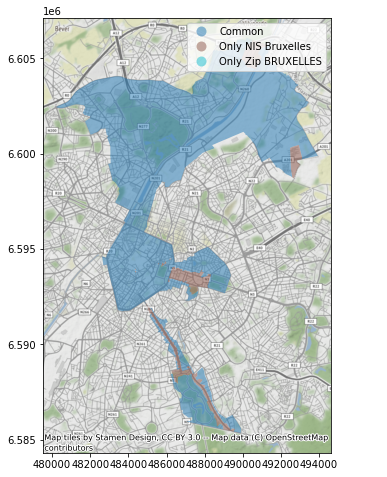

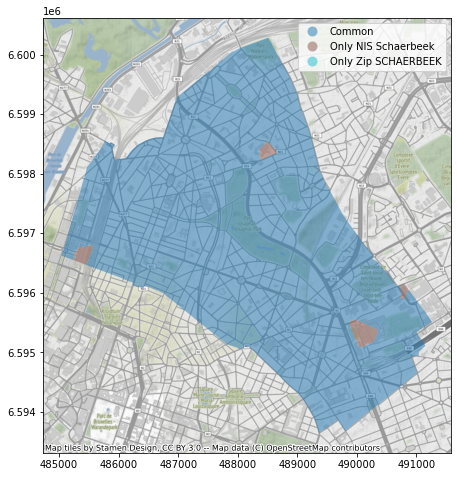

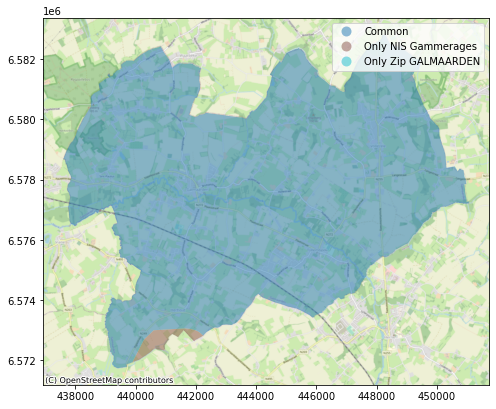

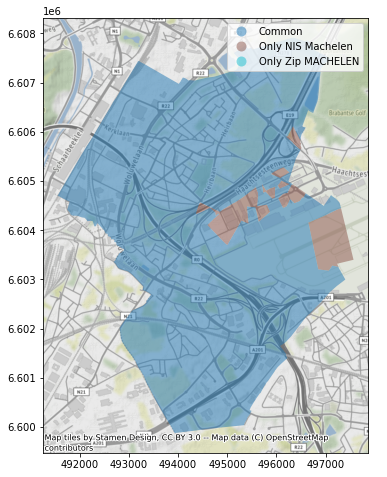

...

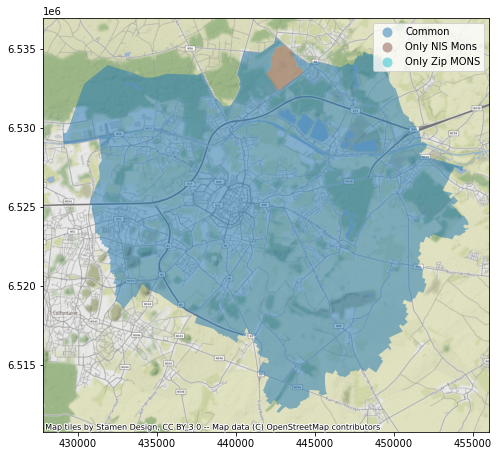

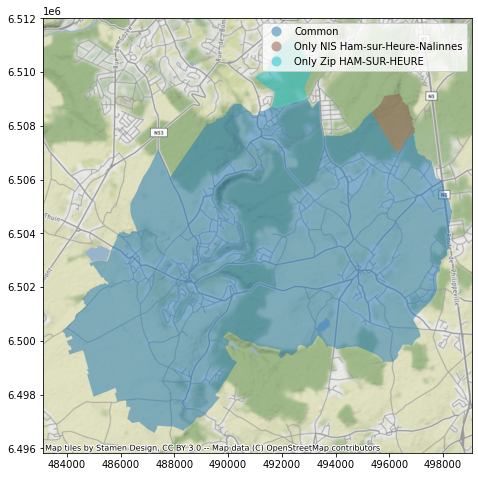

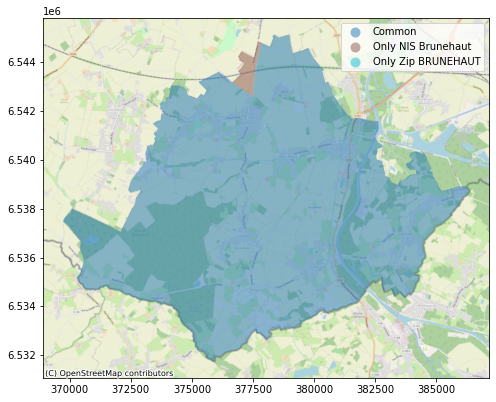

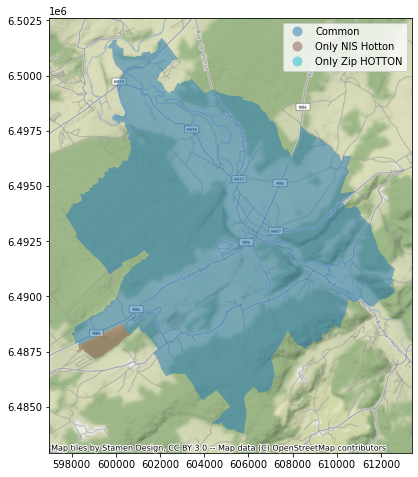

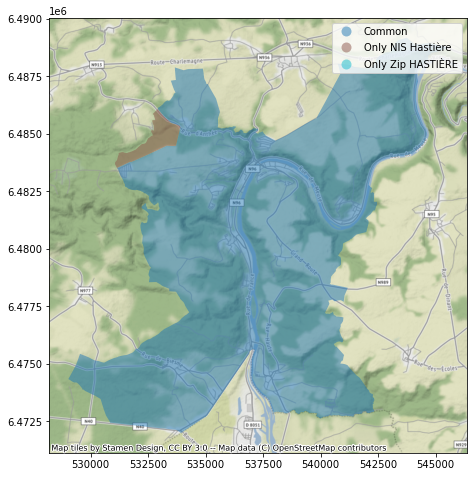

In [56]:
for key, rec in bpost_statbel_mismatch.iterrows():
    #print(rec)
    
    df = rec[["only_nis_geom", "only_zip_geom", "common_geom"]].rename("geom").reset_index().set_geometry("geom").set_crs(target_crs).to_crs(lamb_crs)
    df["index"] = df["index"].replace({
        "only_nis_geom" : f"Only NIS {rec.t_mun_fr}", 
        "only_zip_geom" : f"Only Zip {rec.main_commune}", 
        "common_geom": "Common"})
    ax = df.plot("index", legend=True, figsize=(8,8), alpha=0.5)
    add_basemap(ax)
    plt.show()

# Indexing

In [57]:
for table in ["zipcodes_boundaries", "zipcodes_centers", "statistical_sectors"]:
    run_request(f"""DROP INDEX IF EXISTS {pg_schema}.idx_{table}_geometry""")

In [58]:
query1 = """
SELECT bnd.zipcode as bnd_zipcode, ctr.zipcode as ctr_zipcode, locality as ctr_locality
FROM gistest.zipcodes_boundaries bnd
JOIN gistest.zipcodes_centers ctr ON ST_Contains(bnd.geometry, ctr.geometry)
"""

In [59]:
query2 = """
SELECT bnd.cs01012020 as bnd_zicode, ctr.zipcode as ctr_zipcode, locality as ctr_locality
FROM gistest.statistical_sectors bnd
JOIN gistest.zipcodes_centers ctr ON ST_Contains(bnd.geometry, ctr.geometry)
"""

In [60]:
%timeit get_request(query1)

9.31 s ± 33.1 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [61]:
get_request(query2)

,bnd_zicode,ctr_zipcode,ctr_locality
0,11001A00-,2630,Aartselaar
1,11002P04-,2180,Ekeren
2,11002A00-,2000,Antwerpen
3,11002A00-,2050,Antwerpen
4,11002A00-,2018,Antwerpen
...,...,...,...
2752,93090D00-,5670,Mazée
2753,93090E00-,5670,Le Mesnil
2754,93090F00-,5670,Oignies-En-Thiérache
2755,93090G00-,5670,Nismes


In [62]:
index="GIST"
# index="SPGIST"
for table in ["zipcodes_boundaries", "zipcodes_centers", "statistical_sectors"]:
    run_request(f"""
    CREATE INDEX idx_{table}_geometry
      ON {pg_schema}.{table}
      USING {index} (geometry)""")

In [63]:
%timeit get_request(query1)

467 ms ± 14.2 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [64]:
%timeit get_request(query2)

315 ms ± 11.4 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


# Illustrations for slides

<AxesSubplot:>

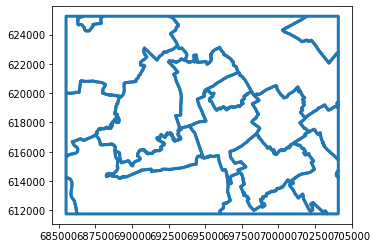

In [65]:
s = zipcodes_boundaries[zipcodes_boundaries.zipcode.str.startswith("533")].copy()
s["geometry"] = s.geometry.buffer(2000)

bounding_box = s.dissolve().envelope
bounding_box = gpd.GeoDataFrame(gpd.GeoSeries(bounding_box), columns=['geometry'])
#Intersecting both GeoDataFrame:

zip_in_bb = gpd.overlay(bounding_box, zipcodes_boundaries, how='intersection')
zip_in_bb.boundary.plot(linewidth=3)

In [67]:
bpost_boundaries = get_geo_request(f"""
select st_makepolygon(st_exteriorring(geometry)) as geometry
from {pg_schema}.bpost_communes bc
join {pg_schema}.zipcodes zc
on bc.main_commune = zc.main_commune 
and zc.zipcode like '5%%'
""").to_crs(zipcodes_boundaries.crs)

In [68]:
zip_com_in_bb = gpd.overlay(bounding_box, bpost_boundaries, how='intersection')
# zip_com_in_bb.boundary.plot()

<AxesSubplot:>

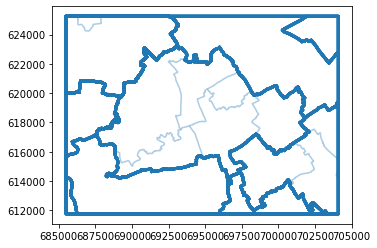

In [69]:
ax=zip_in_bb.boundary.plot(alpha=0.2)
zip_com_in_bb.boundary.plot(ax=ax, linewidth=3)

In [73]:
stat_sectors = get_geo_request(f"""
select geometry, cnis5_2020
from {pg_schema}.statistical_sectors
WHERE c_nis6 like '9%%'
""").to_crs(zipcodes_boundaries.crs)

<AxesSubplot:>

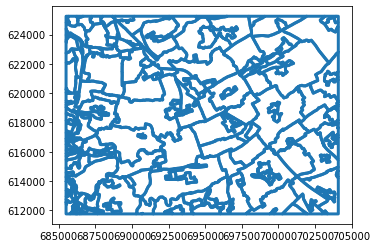

In [74]:
nis_in_bb = gpd.overlay(bounding_box, stat_sectors, how='intersection')
nis_in_bb.boundary.plot(linewidth=3)

In [75]:
nis_com_in_bb = stat_sectors.dissolve("cnis5_2020")
nis_com_in_bb = gpd.overlay(bounding_box, nis_com_in_bb, how='intersection')
# nis_com_in_bb.boundary.plot()

<AxesSubplot:>

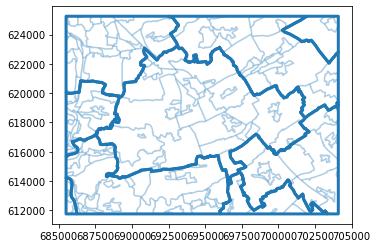

In [76]:
ax=nis_in_bb.boundary.plot(alpha=0.2)
nis_com_in_bb.boundary.plot(ax=ax, linewidth=3)

In [80]:
centers_in_bb = gpd.overlay(bounding_box, zipcodes_centers.to_crs(bounding_box.crs), how='intersection', keep_geom_type=False) 
# centers_in_bb.plot()

<AxesSubplot:>

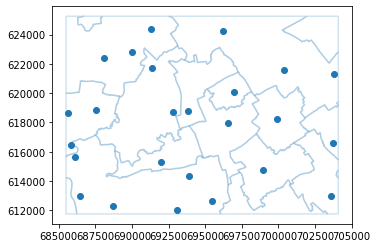

In [81]:
ax= zip_in_bb.boundary.plot(alpha=0.2)
centers_in_bb.plot(ax=ax)